In [6]:
import SimpleITK as sitk
import pydicom
import numpy as np
import pydicom
import cv2
import matplotlib.pyplot as plt
import os
from skimage.transform import resize

img = sitk.ReadImage('/home/Sean/Project/iRail_US/Data/data/169/169_0009.DCM')
# Resize the pixels


In [20]:
%pwd

'/home/Sean/Project/iRail_US'

## Not work but great approach


https://stackoverflow.com/questions/41714570/remove-pixel-annotations-in-dicom-image

In [32]:
!convert /home/Sean/Project/iRail_US/Data/data/169/169_0009.DCM -threshold 80% -negate /home/Sean/Project/iRail_US/mask.png


In [33]:
!convert /home/Sean/Project/iRail_US/Data/data/169/169_0009.DCM /home/Sean/Project/iRail_US/mask.png -compose darken -composite /home/Sean/Project/iRail_US/result.jpg


## From the beggining

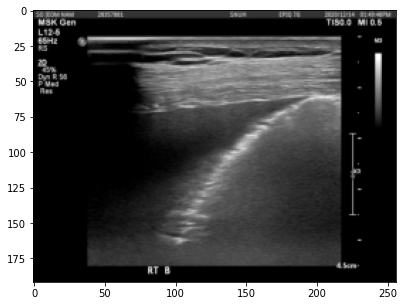

In [39]:
img = pydicom.dcmread('/home/Sean/Project/iRail_US/Data/data/169/169_0009.DCM')
# Resize the pixels
w = int(img.pixel_array.shape[0] * .25)
h = int(img.pixel_array.shape[1] * .25)

px = img.pixel_array / 255
img = resize(px, (w, h), anti_aliasing=True).astype(float)

# scale the pixels
img = (np.maximum(img,0) / img.max()) * 255.0
img = np.uint8(img)

# TODO: Invert MONOCHROME1 images here.

# Display the original image
plt.figure(figsize=(15,5))
plt.imshow(img,cmap="gray");

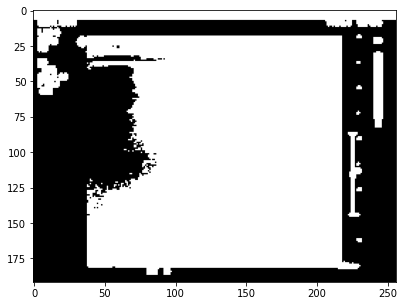

In [41]:
# Make a binarized copy of the image
thresh = 0
img_bin = cv2.threshold(img, thresh, 255, cv2.THRESH_BINARY)[1]

plt.figure(figsize=(15,5))
plt.imshow(img_bin,cmap="gray");

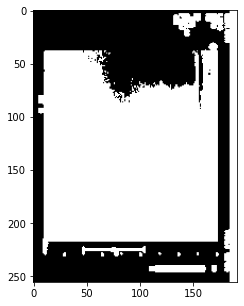

In [42]:
# Flip the image 90 degrees
img_bin = cv2.rotate(img_bin, cv2.cv2.ROTATE_90_CLOCKWISE)
plt.figure(figsize=(15,5))
plt.imshow(img_bin,cmap="gray");

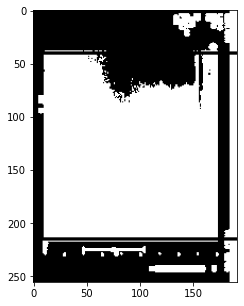

In [44]:
right = 0;
left = 0;
line_thickness = 2

# This is the value that specifies how bright a row is to consider it 'not the edge (too bright)'
intensity_threshold = 100

# Start at the bottom and work upwards checking the mean of pixels in every 10th row, this is the right side of the image
for i in range(img_bin.shape[0]-1,0,-10):
    row_mean = img_bin[i].mean()
    if row_mean > intensity_threshold:
        right = i
        
        # Draw a line where we want to crop
        cv2.line(img_bin, (0, i), (img_bin.shape[1], i), (0, img_bin.shape[1], 0), thickness=line_thickness)
        break
        
# Start at the top and go down to find the left side
for i in range(0,img_bin.shape[0]-1,10):
    row_mean = img_bin[i].mean()
    if row_mean > intensity_threshold:
        left = i
        
        # Draw a line where we want to crop
        cv2.line(img_bin, (0, i), (img_bin.shape[1], i), (0, img_bin.shape[1], 0), thickness=line_thickness)
        break
        
# Draw lines on the image where the mean intensity is > intensity_threshold
plt.figure(figsize=(15,5))
plt.imshow(img_bin,cmap="gray");

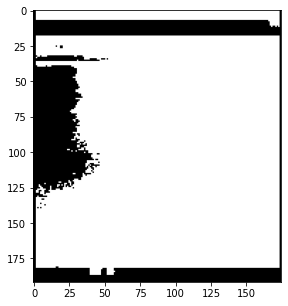

In [45]:
# Rotate the image back to it's normal orientation
img_bin = cv2.rotate(img_bin, cv2.cv2.ROTATE_90_COUNTERCLOCKWISE)

x1 = left
y1 = 0
x2 = right
y2 = img_bin.shape[1]

# Grab the region we identified from the binarized image
img_cropped = img_bin[y1:y2, x1:x2]
plt.figure(figsize=(15,5))
plt.imshow(img_cropped,cmap="gray");

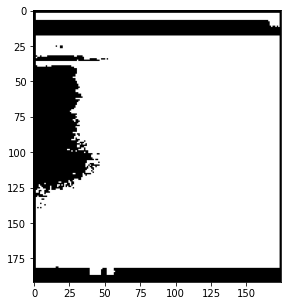

In [46]:
top = 0;
bottom = 0;

# Set some threshold values to specify what we consider edge vs patient
bright_threshold = 100
dark_threshold = 20

# Start at the bottom and work upward
for i in range(img_cropped.shape[0]-1,0,-10):
    row_mean = img_cropped[i].mean()
    if row_mean < bright_threshold:
        # Add 100 pixels of padding so we don't cut the costophrenic angles off
        bottom = i + 100
        cv2.line(img_cropped, (0, bottom), (img_cropped.shape[1], bottom), (0, img_cropped.shape[1], 0), thickness=line_thickness)
        break
        
# Start at the top and go down
for i in range(0,img_cropped.shape[0]-1,10):
    row_mean = img_cropped[i].mean()
    if row_mean > dark_threshold:
        top = i
        cv2.line(img_cropped, (0, i), (img_cropped.shape[1], i), (0, img_cropped.shape[1], 0), thickness=line_thickness)
        break
        
plt.figure(figsize=(15,5))
plt.imshow(img_cropped,cmap="gray");

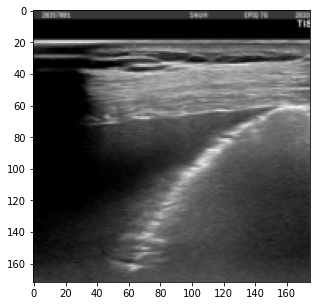

In [50]:
x1 = 0
y1 = top
x2 = img_bin.shape[0]
y2 = bottom

img_cropped = img_cropped[y1:y2, x1:x2]
plt.figure(figsize=(15,5))
plt.imshow(img_cropped,cmap="gray");

TypeError: Invalid shape (47425,) for image data

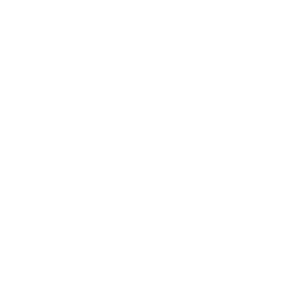

In [51]:
img_cropped = img[top:bottom, left:right]
img_cropped = img_cropped[:-20]
plt.figure(figsize=(15,5))

plt.axis('off')
plt.imshow(img_cropped,cmap="gray")
os.makedirs(my_path + '/' +paths[2].split('/data/')[-1].split('/')[0], exist_ok=True)

plt.savefig(os.path.join(my_path, paths[2].split('/data/')[-1].split('.DCM')[0] + '.jpg'), bbox_inches="tight", pad_inches=0)        


## DCM-PNG

https://medium.com/@vivek8981/dicom-to-jpg-and-extract-all-patients-information-using-python-5e6dd1f1a07d

In [199]:
import pydicom as dicom
import matplotlib.pyplot as plt
import os
import cv2
import PIL # optional
import pandas as pd
import csv
# make it True if you want in PNG format
PNG = True

# Specify the .dcm folder path
folder_path = "/home/Sean/Project/iRail_US/Data/data/169/"
# Specify the .jpg/.png folder path
jpg_folder_path = "/home/Sean/Project/iRail_US/temp/"
images_path = os.listdir(folder_path)
images_path[:2]

['169_0019.DCM', '169_0018.DCM']

In [55]:
for n, image in enumerate(images_path):
    ds = dicom.dcmread(os.path.join(folder_path, image))
    pixel_array_numpy = ds.pixel_array
    if PNG == False:
        image = image.replace('.DCM', '.jpg')
    else:
        image = image.replace('.DCM', '.png')
    cv2.imwrite(os.path.join(jpg_folder_path, image), pixel_array_numpy)
    if n % 50 == 0:
        print('{} image converted'.format(n))

0 image converted


> 성공

### 여러장 PNG

In [191]:
import glob
image_dir  =  glob.glob("/home/Sean/Project/iRail_US/Data/data"+os.sep+"/*/*.DCM")
len(image_dir)

5062

In [246]:
PNG = True

# Specify the .dcm folder path
folder_path = "/home/Sean/Project/iRail_US/Data/data/"
# Specify the .jpg/.png folder path
jpg_folder_path = "/home/Sean/Project/iRail_US/temp/"

images_path = []

for i in range(len(paths)):
    #images_path.append(paths[i].split('/')[-1])
    images_path.append(paths[i].split('data/')[-1])
    images_path.sort()
    
print(images_path[:2])

['001/001_0000.DCM', '001/001_0001.DCM']


In [257]:
# making folders
dest = '/home/Sean/Project/iRail_US/cropped_data/Data'
my_path = os.path.abspath(dest) 

for i in range(len(paths)):
    img = pydicom.dcmread(paths[i])
    
    os.makedirs(my_path + '/' + paths[i].split('/data/')[-1].split('/')[0], exist_ok=True)

In [899]:
jpg_folder_path = "/home/Sean/Project/iRail_US/cropped_data/Data"

In [900]:
jpg_folder_path = "/home/Sean/Project/iRail_US/cropped_data/Data"
for n, image in enumerate(images_path):
    ds = dicom.dcmread(os.path.join(folder_path, image))
    pixel_array_numpy = ds.pixel_array
    if PNG == False:
        image = image.replace('.DCM', '.jpg')
    else:
        image = image.replace('.DCM', '.png')
    cv2.imwrite(os.path.join(jpg_folder_path, image), pixel_array_numpy)
    if n % 50 == 0:
        print('{} image converted'.format(n))

0 image converted
50 image converted
100 image converted
150 image converted
200 image converted
250 image converted
300 image converted
350 image converted
400 image converted
450 image converted
500 image converted
550 image converted
600 image converted
650 image converted
700 image converted
750 image converted
800 image converted
850 image converted
900 image converted
950 image converted
1000 image converted
1050 image converted
1100 image converted
1150 image converted
1200 image converted
1250 image converted
1300 image converted
1350 image converted
1400 image converted
1450 image converted
1500 image converted
1550 image converted
1600 image converted
1650 image converted
1700 image converted
1750 image converted
1800 image converted
1850 image converted
1900 image converted
1950 image converted
2000 image converted
2050 image converted
2100 image converted
2150 image converted
2200 image converted
2250 image converted
2300 image converted
2350 image converted
2400 image conv

In [902]:
PNG_dir  =  glob.glob("/home/Sean/Project/iRail_US/cropped_data/Data"+os.sep+"/*/*")
len(PNG_dir)

4885

In [866]:
PNG_dir[:2]

['/home/Sean/Project/iRail_US/cropped_data/Data/187/187_0000.png',
 '/home/Sean/Project/iRail_US/cropped_data/Data/187/187_0001.png']

## 실험용 폴더 생성

In [939]:
# making second folders
dest = '/home/Sean/Project/iRail_US/cropped_data/Cropped'
my_path = os.path.abspath(dest) 

for i in range(len(paths)):
    img = pydicom.dcmread(paths[i])
    
    os.makedirs(my_path + '/' + paths[i].split('/data/')[-1].split('/')[0], exist_ok=True)

In [940]:
jpg_folder_path = "/home/Sean/Project/iRail_US/cropped_data/Cropped"
for n, image in enumerate(images_path):
    ds = dicom.dcmread(os.path.join(folder_path, image))
    pixel_array_numpy = ds.pixel_array
    if PNG == False:
        image = image.replace('.DCM', '.jpg')
    else:
        image = image.replace('.DCM', '.png')
    cv2.imwrite(os.path.join(jpg_folder_path, image), pixel_array_numpy)
    if n % 50 == 0:
        print('{} image converted'.format(n))

0 image converted
50 image converted
100 image converted
150 image converted
200 image converted
250 image converted
300 image converted
350 image converted
400 image converted
450 image converted
500 image converted
550 image converted
600 image converted
650 image converted
700 image converted
750 image converted
800 image converted
850 image converted
900 image converted
950 image converted
1000 image converted
1050 image converted
1100 image converted
1150 image converted
1200 image converted
1250 image converted
1300 image converted
1350 image converted
1400 image converted
1450 image converted
1500 image converted
1550 image converted
1600 image converted
1650 image converted
1700 image converted
1750 image converted
1800 image converted
1850 image converted
1900 image converted
1950 image converted
2000 image converted
2050 image converted
2100 image converted
2150 image converted
2200 image converted
2250 image converted
2300 image converted
2350 image converted
2400 image conv

In [879]:
PNG_dir2  =  glob.glob("/home/Sean/Project/iRail_US/cropped_data/Cropped"+os.sep+"/*/*")
len(PNG_dir2)

4885

In [ ]:
def border_crop(path, savedir):
    im = Image.open(path)
    im_arr = np.array(im)
    height, width, _ = im_arr.shape
    for y in range(height//2):
        line = im_arr[y] > 250
        if np.count_nonzero(line) == 3 * len(line):
            upper_border = y
        line = im_arr[height-y-1] > 250
        if np.count_nonzero(line) == 3 * len(line):
            lower_border = height - y
    cropped_im_arr = im_arr[upper_border:lower_border]
    for x in range(width//2):
        if x < width//4:
            line = cropped_im_arr[:,x] > 250
            if np.count_nonzero(line) == 3 * len(line):
                left_border = x
        line = cropped_im_arr[:,x] > 250
        if np.count_nonzero(line) == 3 * len(line):
            mid_border = x
    MARGIN = 5
    upper_border -= MARGIN
    lower_border += MARGIN
    left_border -= MARGIN
    mid_border += MARGIN
    os.makedirs(savedir, exist_ok=True)
    im.convert(‘RGB’).crop((left_border, upper_border, mid_border, lower_border)).save(f”{savedir}/{path.split(‘/’)[-1]}“)

## PNG ROI Crop

https://madflex.de/find-and-crop-using-opencv/

https://stackoverflow.com/questions/38025838/normalizing-images-in-opencv

https://stackoverflow.com/questions/21568131/remove-black-borders-on-images-with-watermarks-in-python/21568925#21568925

# 이코드 이용

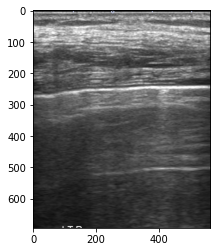

In [892]:
# https://stackoverflow.com/questions/50792812/how-to-remove-watermark-background-in-image-python/50800425#50800425
import cv2
import numpy as np

img = cv2.imread("/home/Sean/Project/iRail_US/cropped_data/Data/185/185_0014.png")

alpha = 2.0
beta = -100

new = alpha * img + beta
new = np.clip(new, 0, 255).astype(np.uint8)

gray = cv2.cvtColor(new,cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray,1,255,cv2.THRESH_BINARY)

contours,hierarchy = cv2.findContours(thresh, 1, 2)

for cnt in contours:
    x,y,w,h = cv2.boundingRect(cnt)
    if w>100 and h>50:
        break
        
cropped = img[y:y+h, x:x+w]
plt.imshow(cropped)


#v2.imwrite("cleaned.png", new)

# 여기까지

# 아래것도 이용

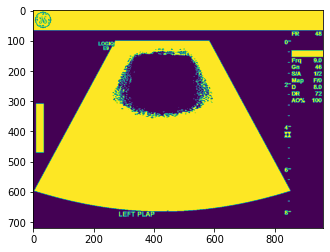

In [930]:
# https://stackoverflow.com/questions/21568131/remove-black-borders-on-images-with-watermarks-in-python/21568925#21568925
img = cv2.imread('/home/Sean/Project/iRail_US/cropped_data/Cropped/001/001_0021.png')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray,1,255,cv2.THRESH_BINARY)
plt.imshow(thresh)

In [931]:
round(thresh.mean())


131

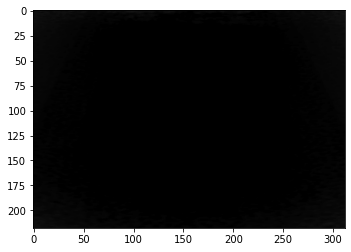

In [896]:
contours,hierarchy = cv2.findContours(thresh, 1, 2)

for cnt in contours:
    x,y,w,h = cv2.boundingRect(cnt)
    if w>100 and h>50:
        break
        
cropped = img[y:y+h, x:x+w]
plt.imshow(cropped)

# 이것까지 이용


## 마지막으로 실험


https://www.youtube.com/watch?v=IBQYqwq_w14&t=641s

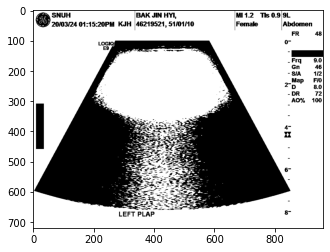

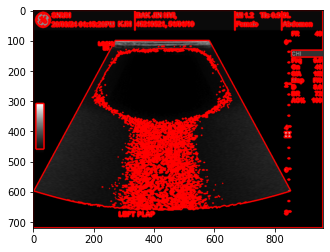

In [973]:
image = cv2.imread('/home/Sean/Project/iRail_US/cropped_data/Cropped/001/001_0021.png')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(image_gray, 10, 255, 0)
thresh = cv2.bitwise_not(thresh)

plt.imshow(cv2.cvtColor(thresh, cv2.COLOR_GRAY2RGB))
plt.show()
###################################
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
image = cv2.drawContours(image, contours, -1, (0, 0, 255), 4)

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()
###################################


#### 다른방법

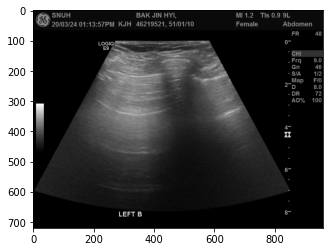

In [1071]:
img = cv2.imread('/home/Sean/Project/iRail_US/cropped_data/Cropped/001/001_0016.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
copy_img = img.copy()
plt.imshow(img)

In [1072]:
lower = np.array([40,40,40])
higher = np.array([250, 250, 250])

In [1073]:
mask = cv2.inRange(img, lower, higher)

In [1074]:
mask.shape

(720, 960)

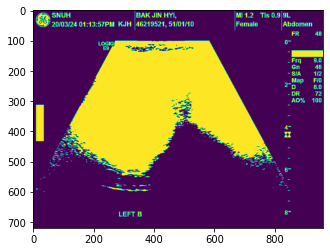

In [1075]:
plt.imshow(mask)

In [1076]:
cont, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

In [1077]:
cont_img = cv2.drawContours(img, cont, -1, 255, 3)

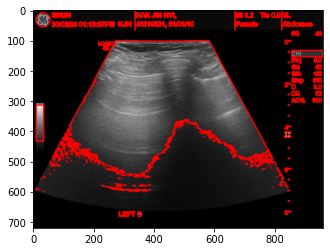

In [1078]:
plt.imshow(cont_img)

In [1079]:
c = max(cont, key = cv2.contourArea)

In [1080]:
x, y, w, h = cv2.boundingRect(c)

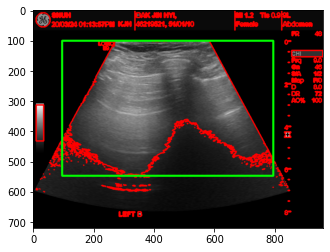

In [1081]:
cv2.rectangle(img, (x,y), (x+w, y+h), (0, 255,0),5)
plt.imshow(img)

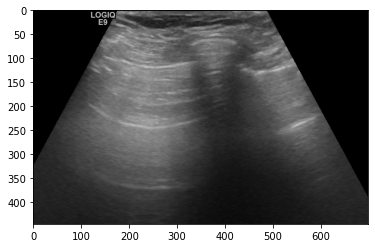

In [1082]:
cropped_image = copy_img[y: y+h ,x: x+w ]
plt.imshow(cropped_image)

#### 통합버전

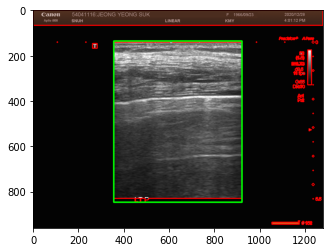

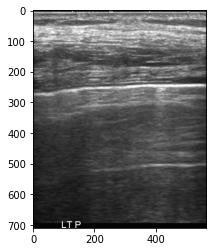

In [1116]:
img = cv2.imread('/home/Sean/Project/iRail_US/cropped_data/Cropped/185/185_0014.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
copy_img = img.copy()

lower = np.array([5,5,5])
higher = np.array([255, 255, 255])

mask = cv2.inRange(img, lower, higher)

cont, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
cont_img = cv2.drawContours(img, cont, -1, 255, 3)
c = max(cont, key = cv2.contourArea)
x, y, w, h = cv2.boundingRect(c)
cv2.rectangle(img, (x,y), (x+w, y+h), (0, 255,0),5)
plt.imshow(img)
plt.show()

cropped_image = copy_img[y: y+h ,x: x+w ]
plt.imshow(cropped_image)
plt.show()

In [1117]:
PNG_dir[1]

'/home/Sean/Project/iRail_US/cropped_data/Data/187/187_0001.png'

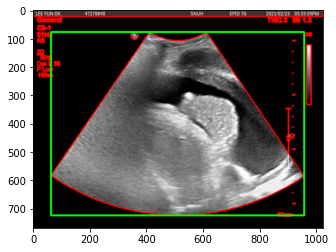

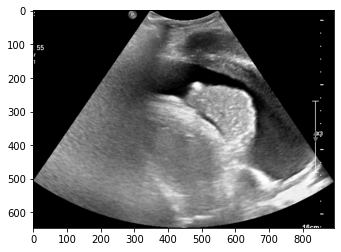

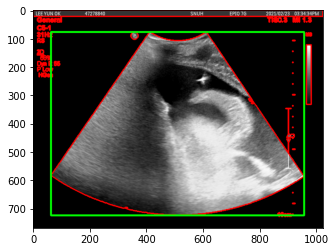

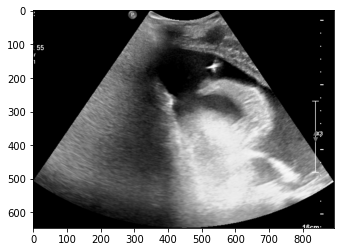

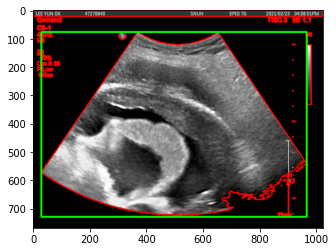

...

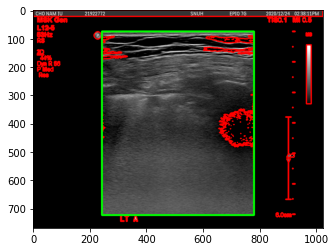

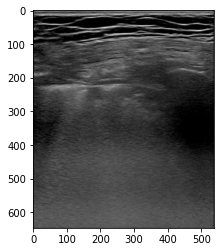

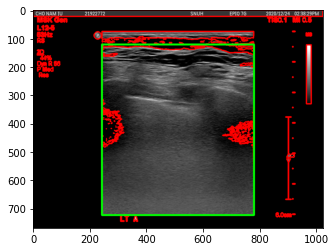

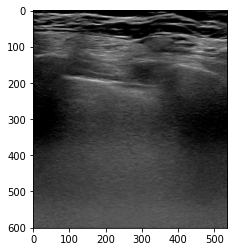

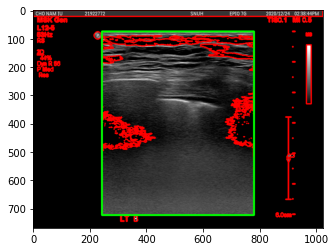

KeyboardInterrupt: 

In [1121]:
for i in PNG_dir2:
    img = cv2.imread(i)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    copy_img = img.copy()

    lower = np.array([5,5,5])
    higher = np.array([255, 255, 255])

    mask = cv2.inRange(img, lower, higher)

    cont, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    cont_img = cv2.drawContours(img, cont, -1, 255, 3)
    c = max(cont, key = cv2.contourArea)
    x, y, w, h = cv2.boundingRect(c)
    cv2.rectangle(img, (x,y), (x+w, y+h), (0, 255,0),5)
    plt.imshow(img)
    plt.show()

    cropped_image = copy_img[y: y+h ,x: x+w ]
    plt.imshow(cropped_image)
    plt.show()

In [694]:
contours,hierarchy = cv2.findContours(thresh,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
cnt = contours[0]
x,y,w,h = cv2.boundingRect(cnt)

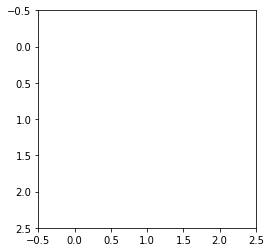

In [695]:
crop = img[y:y+h,x:x+w]
plt.imshow(crop)

In [ ]:
cv2.imwrite('/home/Sean/Project/iRail_US/temp/sofwinres.png',crop)

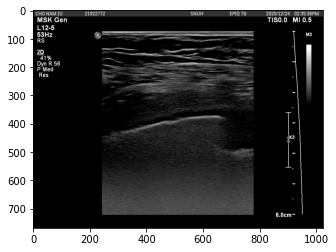

In [697]:
image = cv2.imread("/home/Sean/Project/iRail_US/cropped_data/Data/182/182_0005.png")
height, width, channels = image.shape
plt.imshow(image)

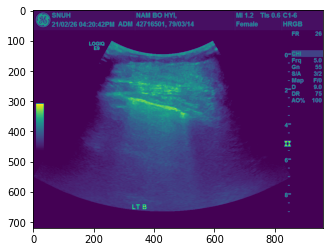

In [661]:
gray = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2GRAY)

plt.imshow(gray)

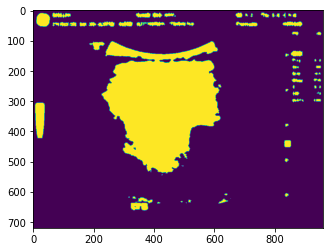

In [662]:
gray = cv2.blur(gray, (11, 11))
#thresh = cv2.threshold(gray, 50, 255, cv2.THRESH_BINARY)[1]
#thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

plt.imshow(thresh)

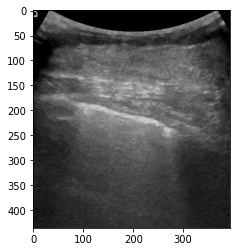

In [666]:
contours,hierarchy = cv2.findContours(thresh, 1, 2)

for cnt in contours:
    x,y,w,h = cv2.boundingRect(cnt)
    if w>100 and h>50:
        break
        
cropped = image[y:y+h, x:x+w]
plt.imshow(cropped)

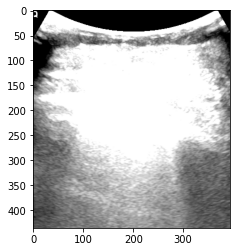

In [633]:
contrast = cv2.convertScaleAbs(cropped, alpha=3, beta=0)
plt.imshow(contrast)

In [188]:
cv2.imwrite('/home/Sean/Project/iRail_US/temp/out.jpg', cropped)

True

> 성공했으니까, 여러이미지 png로 바꾸기 

In [849]:
PNG_dir[1]

'/home/Sean/Project/iRail_US/cropped_data/Data/187/187_0001.png'

In [280]:
PNG_dir[1].split('/')[-1]

'187_0001.png'

In [872]:
PNG_dir2[2]

'/home/Sean/Project/iRail_US/cropped_data/Cropped/187/187_0002.png'

In [903]:
for i in PNG_dir:
    img = cv2.imread(i)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    _,thresh = cv2.threshold(gray,1,255,cv2.THRESH_BINARY)
    alpha = 2.0
    beta = -100
    
    if thresh.mean() <= 250 :
        new = alpha * img + beta
        new = np.clip(new, 0, 255).astype(np.uint8)
        gray = cv2.cvtColor(new,cv2.COLOR_BGR2GRAY)
        _,thresh = cv2.threshold(gray,1,255,cv2.THRESH_BINARY)
        
        
        
        if round(thresh.mean()) == 131 :
            contours,hierarchy = cv2.findContours(thresh, 1, 2)
            for cnt in contours:
                x,y,w,h = cv2.boundingRect(cnt)
                if w>100 and h>50:
                    break
            cropped = img[y:y+h, x:x+w]
            cv2.imwrite(i, cropped)
        
        
        contours,hierarchy = cv2.findContours(thresh, 1, 2)
        
        for cnt in contours:
            x,y,w,h = cv2.boundingRect(cnt)
            if w>100 and h>50:
                break
            
        cropped = img[y:y+h, x:x+w]
        cv2.imwrite(i, cropped)

    contours,hierarchy = cv2.findContours(thresh, 1, 2)
    for cnt in contours:
        x,y,w,h = cv2.boundingRect(cnt)
        if w>100 and h>50:
            break
    cropped = img[y:y+h, x:x+w]
    cv2.imwrite(i, cropped)

> home/Sean/Project/iRail_US/cropped_data/Data
\ 여기로 이미지 크롭 저장 완료